# Model Testing on Train Set

In [16]:
import os
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "expandable_segments:True"

import torch
import torchvision.transforms as transforms
import torch.nn.functional as F
from torchmetrics.image.psnr import PeakSignalNoiseRatio
from torchmetrics.image.ssim import StructuralSimilarityIndexMeasure
from PIL import Image
import numpy as np
from tqdm import tqdm

model_path = "/kaggle/input/model-26-epoch/srgan_generator_epoch_26.pth"
test_hr_dir = "/kaggle/input/model-test-images/Model_Test_Images/Train_Images"


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Scale factor
scale = 4

to_tensor = transforms.ToTensor()

# Metrics
psnr_metric = PeakSignalNoiseRatio(data_range=1.0).to(device)
ssim_metric = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)

# Residual Block
import torch.nn as nn

class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels),
            nn.PReLU(),
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels)
        )

    def forward(self, x):
        return x + self.block(x)

# Generator Network
class Generator(nn.Module):
    def __init__(self, scale_factor=4, num_residual_blocks=16):
        super(Generator, self).__init__()
        self.initial = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=9, padding=4),
            nn.PReLU()
        )
        self.res_blocks = nn.Sequential(*[ResidualBlock(64) for _ in range(num_residual_blocks)])
        self.bottleneck = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64)
        )
        upsample_blocks = []
        for _ in range(int(scale_factor / 2)):
            upsample_blocks += [
                nn.Conv2d(64, 256, kernel_size=3, padding=1),
                nn.PixelShuffle(2),
                nn.PReLU()
            ]
        self.upsampling = nn.Sequential(*upsample_blocks)
        self.final = nn.Conv2d(64, 3, kernel_size=9, padding=4)

    def forward(self, x):
        initial = self.initial(x)
        res = self.res_blocks(initial)
        bottleneck = self.bottleneck(res)
        upsampled = self.upsampling(initial + bottleneck)
        return self.final(upsampled)

# Evaluation function
def evaluate_model(model_path, epoch_id):
    generator = Generator().to(device)
    generator.load_state_dict(torch.load(model_path, map_location=device))
    generator.eval()

    total_psnr, total_ssim, count = 0.0, 0.0, 0

    for img_name in tqdm(os.listdir(test_hr_dir), desc=f"Epoch {epoch_id}"):
        if not img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
            continue

        # Load HR image
        hr_img = Image.open(os.path.join(test_hr_dir, img_name)).convert("RGB")
        hr_tensor = to_tensor(hr_img).unsqueeze(0).to(device)

        # Generate LR image by downscaling
        lr_img = hr_img.resize((hr_img.width // scale, hr_img.height // scale), Image.BICUBIC)
        lr_tensor = to_tensor(lr_img).unsqueeze(0).to(device)

        # SR prediction
        with torch.no_grad():
            sr_tensor = generator(lr_tensor)
            sr_tensor = torch.clamp(sr_tensor, 0, 1)

        # Resize to HR dimensions for metrics
        sr_resized = F.interpolate(sr_tensor, size=hr_tensor.shape[-2:], mode='bicubic', align_corners=False)

        # Compute metrics
        psnr = psnr_metric(sr_resized, hr_tensor).item()
        ssim = ssim_metric(sr_resized, hr_tensor).item()

        total_psnr += psnr
        total_ssim += ssim
        count += 1

        del hr_tensor, lr_tensor, sr_tensor, sr_resized
        torch.cuda.empty_cache()

    avg_psnr = total_psnr / count
    avg_ssim = total_ssim / count

    print(f"\n Epoch {epoch_id} → Avg PSNR: {avg_psnr:.2f} | Avg SSIM: {avg_ssim:.4f}")

    del generator
    torch.cuda.empty_cache()

    return epoch_id, avg_psnr, avg_ssim

epoch_id = 26
result = evaluate_model(model_path, epoch_id)


<ipython-input-16-c0c00a0c8bac>:80: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  generator.load_state_dict(torch.load(model_path, map_location=device))
Epoch 26: 100%|█████


 Epoch 26 → Avg PSNR: 26.45 | Avg SSIM: 0.7101


# Model Testing on Test Set

In [17]:
import os
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "expandable_segments:True"

import torch
import torchvision.transforms as transforms
import torch.nn.functional as F
from torchmetrics.image.psnr import PeakSignalNoiseRatio
from torchmetrics.image.ssim import StructuralSimilarityIndexMeasure
from PIL import Image
import numpy as np
from tqdm import tqdm

model_path = "/kaggle/input/model-26-epoch/srgan_generator_epoch_26.pth"
test_hr_dir = "/kaggle/input/model-test-images/Model_Test_Images/Test_Images"


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Scale factor
scale = 4

to_tensor = transforms.ToTensor()

# Metrics
psnr_metric = PeakSignalNoiseRatio(data_range=1.0).to(device)
ssim_metric = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)

# Residual Block
import torch.nn as nn

class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels),
            nn.PReLU(),
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels)
        )

    def forward(self, x):
        return x + self.block(x)

# Generator Network
class Generator(nn.Module):
    def __init__(self, scale_factor=4, num_residual_blocks=16):
        super(Generator, self).__init__()
        self.initial = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=9, padding=4),
            nn.PReLU()
        )
        self.res_blocks = nn.Sequential(*[ResidualBlock(64) for _ in range(num_residual_blocks)])
        self.bottleneck = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64)
        )
        upsample_blocks = []
        for _ in range(int(scale_factor / 2)):
            upsample_blocks += [
                nn.Conv2d(64, 256, kernel_size=3, padding=1),
                nn.PixelShuffle(2),
                nn.PReLU()
            ]
        self.upsampling = nn.Sequential(*upsample_blocks)
        self.final = nn.Conv2d(64, 3, kernel_size=9, padding=4)

    def forward(self, x):
        initial = self.initial(x)
        res = self.res_blocks(initial)
        bottleneck = self.bottleneck(res)
        upsampled = self.upsampling(initial + bottleneck)
        return self.final(upsampled)

# Evaluation function
def evaluate_model(model_path, epoch_id):
    generator = Generator().to(device)
    generator.load_state_dict(torch.load(model_path, map_location=device))
    generator.eval()

    total_psnr, total_ssim, count = 0.0, 0.0, 0

    for img_name in tqdm(os.listdir(test_hr_dir), desc=f"Epoch {epoch_id}"):
        if not img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
            continue

        # Load HR image
        hr_img = Image.open(os.path.join(test_hr_dir, img_name)).convert("RGB")
        hr_tensor = to_tensor(hr_img).unsqueeze(0).to(device)

        # Generate LR image by downscaling
        lr_img = hr_img.resize((hr_img.width // scale, hr_img.height // scale), Image.BICUBIC)
        lr_tensor = to_tensor(lr_img).unsqueeze(0).to(device)

        # SR prediction
        with torch.no_grad():
            sr_tensor = generator(lr_tensor)
            sr_tensor = torch.clamp(sr_tensor, 0, 1)

        # Resize to HR dimensions for metrics
        sr_resized = F.interpolate(sr_tensor, size=hr_tensor.shape[-2:], mode='bicubic', align_corners=False)

        # Compute metrics
        psnr = psnr_metric(sr_resized, hr_tensor).item()
        ssim = ssim_metric(sr_resized, hr_tensor).item()

        total_psnr += psnr
        total_ssim += ssim
        count += 1

        del hr_tensor, lr_tensor, sr_tensor, sr_resized
        torch.cuda.empty_cache()

    avg_psnr = total_psnr / count
    avg_ssim = total_ssim / count

    print(f"\n Epoch {epoch_id} → Avg PSNR: {avg_psnr:.2f} | Avg SSIM: {avg_ssim:.4f}")

    del generator
    torch.cuda.empty_cache()

    return epoch_id, avg_psnr, avg_ssim

epoch_id = 26
result = evaluate_model(model_path, epoch_id)


<ipython-input-17-2b694248c2ff>:78: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  generator.load_state_dict(torch.load(model_path, map_location=device))
Epoch 26: 100%|█████


 Epoch 26 → Avg PSNR: 25.39 | Avg SSIM: 0.6884


# Test Images

<ipython-input-1-23449e7b4768>:81: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  generator.load_state_dict(torch.load(model_path, map_location=device))


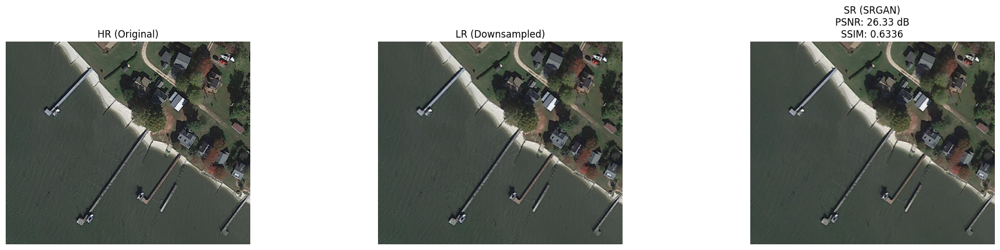

In [1]:
import os
import torch
import torchvision.transforms as transforms
import torch.nn.functional as F
from torchmetrics.image.psnr import PeakSignalNoiseRatio
from torchmetrics.image.ssim import StructuralSimilarityIndexMeasure
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np


model_path = "/kaggle/input/model-26-epoch/srgan_generator_epoch_26.pth"
test_image_path = "/kaggle/input/model-test-images/Model_Test_Images/Test_Images/P0616.png"  
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Scale factor
scale = 4

to_tensor = transforms.ToTensor()
to_pil = transforms.ToPILImage()

# Metrics
psnr_metric = PeakSignalNoiseRatio(data_range=1.0).to(device)
ssim_metric = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)

# Residual Block
import torch.nn as nn
class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels),
            nn.PReLU(),
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels)
        )

    def forward(self, x):
        return x + self.block(x)

# Generator
class Generator(nn.Module):
    def __init__(self, scale_factor=4, num_residual_blocks=16):
        super(Generator, self).__init__()
        self.initial = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=9, padding=4),
            nn.PReLU()
        )

        self.res_blocks = nn.Sequential(
            *[ResidualBlock(64) for _ in range(num_residual_blocks)]
        )

        self.bottleneck = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64)
        )

        upsample_blocks = []
        for _ in range(int(scale_factor / 2)):
            upsample_blocks += [
                nn.Conv2d(64, 256, kernel_size=3, padding=1),
                nn.PixelShuffle(2),
                nn.PReLU()
            ]
        self.upsampling = nn.Sequential(*upsample_blocks)

        self.final = nn.Conv2d(64, 3, kernel_size=9, padding=4)

    def forward(self, x):
        initial = self.initial(x)
        res = self.res_blocks(initial)
        bottleneck = self.bottleneck(res)
        upsampled = self.upsampling(initial + bottleneck)
        return self.final(upsampled)

# Load model
generator = Generator().to(device)
generator.load_state_dict(torch.load(model_path, map_location=device))
generator.eval()

# Load HR image
hr_img = Image.open(test_image_path).convert("RGB")
hr_tensor = to_tensor(hr_img).unsqueeze(0).to(device)

# Generate LR image
lr_img = hr_img.resize((hr_img.width // scale, hr_img.height // scale), Image.BICUBIC)
lr_tensor = to_tensor(lr_img).unsqueeze(0).to(device)

# Super-resolve
with torch.no_grad():
    sr_tensor = generator(lr_tensor)
    sr_tensor = torch.clamp(sr_tensor, 0, 1)


sr_resized = F.interpolate(sr_tensor, size=hr_tensor.shape[-2:], mode='bicubic', align_corners=False)

# Metrics
psnr = psnr_metric(sr_resized, hr_tensor).item()
ssim = ssim_metric(sr_resized, hr_tensor).item()

# Convert to PIL for display
hr_pil = to_pil(hr_tensor.squeeze().cpu())
lr_pil = to_pil(lr_tensor.squeeze().cpu())
sr_pil = to_pil(sr_resized.squeeze().cpu())


fig, axes = plt.subplots(1, 3, figsize=(20, 5))
axes[0].imshow(hr_pil)
axes[0].set_title("HR (Original)", fontsize=12)
axes[1].imshow(lr_pil)
axes[1].set_title("LR (Downsampled)", fontsize=12)
axes[2].imshow(sr_pil)
axes[2].set_title(f"SR (SRGAN)\nPSNR: {psnr:.2f} dB\nSSIM: {ssim:.4f}", fontsize=12)


for ax in axes:
    ax.axis("off")

plt.tight_layout(pad=3.0)  
plt.show()


<ipython-input-2-a8624f8ac92c>:80: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  generator.load_state_dict(torch.load(model_path, map_location=device))


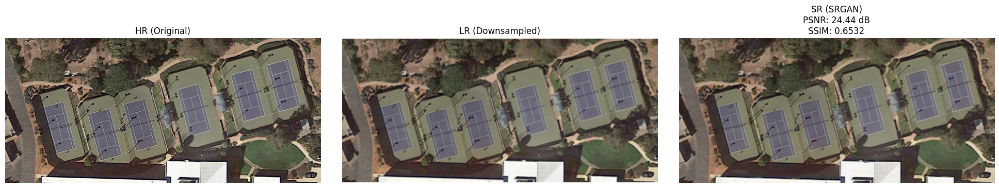

In [2]:
import os
import torch
import torchvision.transforms as transforms
import torch.nn.functional as F
from torchmetrics.image.psnr import PeakSignalNoiseRatio
from torchmetrics.image.ssim import StructuralSimilarityIndexMeasure
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np


model_path = "/kaggle/input/model-26-epoch/srgan_generator_epoch_26.pth"
test_image_path = "/kaggle/input/model-test-images/Model_Test_Images/Test_Images/P0808.png"  
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Scale factor
scale = 4

to_tensor = transforms.ToTensor()
to_pil = transforms.ToPILImage()

# Metrics
psnr_metric = PeakSignalNoiseRatio(data_range=1.0).to(device)
ssim_metric = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)

# Residual Block
import torch.nn as nn
class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels),
            nn.PReLU(),
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels)
        )

    def forward(self, x):
        return x + self.block(x)

# Generator
class Generator(nn.Module):
    def __init__(self, scale_factor=4, num_residual_blocks=16):
        super(Generator, self).__init__()
        self.initial = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=9, padding=4),
            nn.PReLU()
        )

        self.res_blocks = nn.Sequential(
            *[ResidualBlock(64) for _ in range(num_residual_blocks)]
        )

        self.bottleneck = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64)
        )

        upsample_blocks = []
        for _ in range(int(scale_factor / 2)):
            upsample_blocks += [
                nn.Conv2d(64, 256, kernel_size=3, padding=1),
                nn.PixelShuffle(2),
                nn.PReLU()
            ]
        self.upsampling = nn.Sequential(*upsample_blocks)

        self.final = nn.Conv2d(64, 3, kernel_size=9, padding=4)

    def forward(self, x):
        initial = self.initial(x)
        res = self.res_blocks(initial)
        bottleneck = self.bottleneck(res)
        upsampled = self.upsampling(initial + bottleneck)
        return self.final(upsampled)

# Load model
generator = Generator().to(device)
generator.load_state_dict(torch.load(model_path, map_location=device))
generator.eval()

# Load HR image
hr_img = Image.open(test_image_path).convert("RGB")
hr_tensor = to_tensor(hr_img).unsqueeze(0).to(device)

# Generate LR image
lr_img = hr_img.resize((hr_img.width // scale, hr_img.height // scale), Image.BICUBIC)
lr_tensor = to_tensor(lr_img).unsqueeze(0).to(device)

# Super-resolve
with torch.no_grad():
    sr_tensor = generator(lr_tensor)
    sr_tensor = torch.clamp(sr_tensor, 0, 1)


sr_resized = F.interpolate(sr_tensor, size=hr_tensor.shape[-2:], mode='bicubic', align_corners=False)

# Metrics
psnr = psnr_metric(sr_resized, hr_tensor).item()
ssim = ssim_metric(sr_resized, hr_tensor).item()

# Convert to PIL for display
hr_pil = to_pil(hr_tensor.squeeze().cpu())
lr_pil = to_pil(lr_tensor.squeeze().cpu())
sr_pil = to_pil(sr_resized.squeeze().cpu())


fig, axes = plt.subplots(1, 3, figsize=(20, 5))
axes[0].imshow(hr_pil)
axes[0].set_title("HR (Original)", fontsize=12)
axes[1].imshow(lr_pil)
axes[1].set_title("LR (Downsampled)", fontsize=12)
axes[2].imshow(sr_pil)
axes[2].set_title(f"SR (SRGAN)\nPSNR: {psnr:.2f} dB\nSSIM: {ssim:.4f}", fontsize=12)


for ax in axes:
    ax.axis("off")

plt.tight_layout(pad=3.0)  
plt.show()


<ipython-input-3-3a09045944ef>:80: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  generator.load_state_dict(torch.load(model_path, map_location=device))


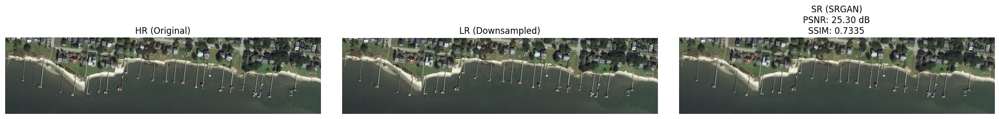

In [3]:
import os
import torch
import torchvision.transforms as transforms
import torch.nn.functional as F
from torchmetrics.image.psnr import PeakSignalNoiseRatio
from torchmetrics.image.ssim import StructuralSimilarityIndexMeasure
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np


model_path = "/kaggle/input/model-26-epoch/srgan_generator_epoch_26.pth"
test_image_path = "/kaggle/input/model-test-images/Model_Test_Images/Test_Images/P0937.png"  
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Scale factor
scale = 4

to_tensor = transforms.ToTensor()
to_pil = transforms.ToPILImage()

# Metrics
psnr_metric = PeakSignalNoiseRatio(data_range=1.0).to(device)
ssim_metric = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)

# Residual Block
import torch.nn as nn
class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels),
            nn.PReLU(),
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels)
        )

    def forward(self, x):
        return x + self.block(x)

# Generator
class Generator(nn.Module):
    def __init__(self, scale_factor=4, num_residual_blocks=16):
        super(Generator, self).__init__()
        self.initial = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=9, padding=4),
            nn.PReLU()
        )

        self.res_blocks = nn.Sequential(
            *[ResidualBlock(64) for _ in range(num_residual_blocks)]
        )

        self.bottleneck = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64)
        )

        upsample_blocks = []
        for _ in range(int(scale_factor / 2)):
            upsample_blocks += [
                nn.Conv2d(64, 256, kernel_size=3, padding=1),
                nn.PixelShuffle(2),
                nn.PReLU()
            ]
        self.upsampling = nn.Sequential(*upsample_blocks)

        self.final = nn.Conv2d(64, 3, kernel_size=9, padding=4)

    def forward(self, x):
        initial = self.initial(x)
        res = self.res_blocks(initial)
        bottleneck = self.bottleneck(res)
        upsampled = self.upsampling(initial + bottleneck)
        return self.final(upsampled)

# Load model
generator = Generator().to(device)
generator.load_state_dict(torch.load(model_path, map_location=device))
generator.eval()

# Load HR image
hr_img = Image.open(test_image_path).convert("RGB")
hr_tensor = to_tensor(hr_img).unsqueeze(0).to(device)

# Generate LR image
lr_img = hr_img.resize((hr_img.width // scale, hr_img.height // scale), Image.BICUBIC)
lr_tensor = to_tensor(lr_img).unsqueeze(0).to(device)

# Super-resolve
with torch.no_grad():
    sr_tensor = generator(lr_tensor)
    sr_tensor = torch.clamp(sr_tensor, 0, 1)


sr_resized = F.interpolate(sr_tensor, size=hr_tensor.shape[-2:], mode='bicubic', align_corners=False)

# Metrics
psnr = psnr_metric(sr_resized, hr_tensor).item()
ssim = ssim_metric(sr_resized, hr_tensor).item()

# Convert to PIL for display
hr_pil = to_pil(hr_tensor.squeeze().cpu())
lr_pil = to_pil(lr_tensor.squeeze().cpu())
sr_pil = to_pil(sr_resized.squeeze().cpu())


fig, axes = plt.subplots(1, 3, figsize=(20, 5))
axes[0].imshow(hr_pil)
axes[0].set_title("HR (Original)", fontsize=12)
axes[1].imshow(lr_pil)
axes[1].set_title("LR (Downsampled)", fontsize=12)
axes[2].imshow(sr_pil)
axes[2].set_title(f"SR (SRGAN)\nPSNR: {psnr:.2f} dB\nSSIM: {ssim:.4f}", fontsize=12)


for ax in axes:
    ax.axis("off")

plt.tight_layout(pad=3.0)  
plt.show()


<ipython-input-4-77bd0ef70de3>:80: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  generator.load_state_dict(torch.load(model_path, map_location=device))


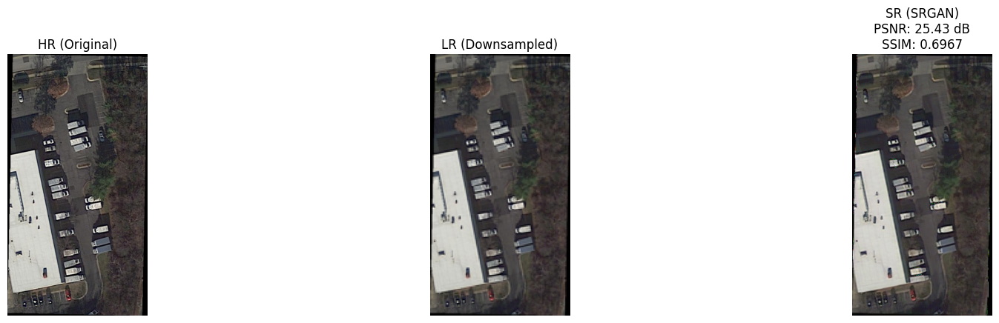

In [4]:
import os
import torch
import torchvision.transforms as transforms
import torch.nn.functional as F
from torchmetrics.image.psnr import PeakSignalNoiseRatio
from torchmetrics.image.ssim import StructuralSimilarityIndexMeasure
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np


model_path = "/kaggle/input/model-26-epoch/srgan_generator_epoch_26.pth"
test_image_path = "/kaggle/input/model-test-images/Model_Test_Images/Test_Images/P1032.png"  
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Scale factor
scale = 4

to_tensor = transforms.ToTensor()
to_pil = transforms.ToPILImage()

# Metrics
psnr_metric = PeakSignalNoiseRatio(data_range=1.0).to(device)
ssim_metric = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)

# Residual Block
import torch.nn as nn
class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels),
            nn.PReLU(),
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels)
        )

    def forward(self, x):
        return x + self.block(x)

# Generator
class Generator(nn.Module):
    def __init__(self, scale_factor=4, num_residual_blocks=16):
        super(Generator, self).__init__()
        self.initial = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=9, padding=4),
            nn.PReLU()
        )

        self.res_blocks = nn.Sequential(
            *[ResidualBlock(64) for _ in range(num_residual_blocks)]
        )

        self.bottleneck = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64)
        )

        upsample_blocks = []
        for _ in range(int(scale_factor / 2)):
            upsample_blocks += [
                nn.Conv2d(64, 256, kernel_size=3, padding=1),
                nn.PixelShuffle(2),
                nn.PReLU()
            ]
        self.upsampling = nn.Sequential(*upsample_blocks)

        self.final = nn.Conv2d(64, 3, kernel_size=9, padding=4)

    def forward(self, x):
        initial = self.initial(x)
        res = self.res_blocks(initial)
        bottleneck = self.bottleneck(res)
        upsampled = self.upsampling(initial + bottleneck)
        return self.final(upsampled)

# Load model
generator = Generator().to(device)
generator.load_state_dict(torch.load(model_path, map_location=device))
generator.eval()

# Load HR image
hr_img = Image.open(test_image_path).convert("RGB")
hr_tensor = to_tensor(hr_img).unsqueeze(0).to(device)

# Generate LR image
lr_img = hr_img.resize((hr_img.width // scale, hr_img.height // scale), Image.BICUBIC)
lr_tensor = to_tensor(lr_img).unsqueeze(0).to(device)

# Super-resolve
with torch.no_grad():
    sr_tensor = generator(lr_tensor)
    sr_tensor = torch.clamp(sr_tensor, 0, 1)


sr_resized = F.interpolate(sr_tensor, size=hr_tensor.shape[-2:], mode='bicubic', align_corners=False)

# Metrics
psnr = psnr_metric(sr_resized, hr_tensor).item()
ssim = ssim_metric(sr_resized, hr_tensor).item()

# Convert to PIL for display
hr_pil = to_pil(hr_tensor.squeeze().cpu())
lr_pil = to_pil(lr_tensor.squeeze().cpu())
sr_pil = to_pil(sr_resized.squeeze().cpu())


fig, axes = plt.subplots(1, 3, figsize=(20, 5))
axes[0].imshow(hr_pil)
axes[0].set_title("HR (Original)", fontsize=12)
axes[1].imshow(lr_pil)
axes[1].set_title("LR (Downsampled)", fontsize=12)
axes[2].imshow(sr_pil)
axes[2].set_title(f"SR (SRGAN)\nPSNR: {psnr:.2f} dB\nSSIM: {ssim:.4f}", fontsize=12)


for ax in axes:
    ax.axis("off")

plt.tight_layout(pad=3.0)  
plt.show()


<ipython-input-5-599a2c806657>:80: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  generator.load_state_dict(torch.load(model_path, map_location=device))


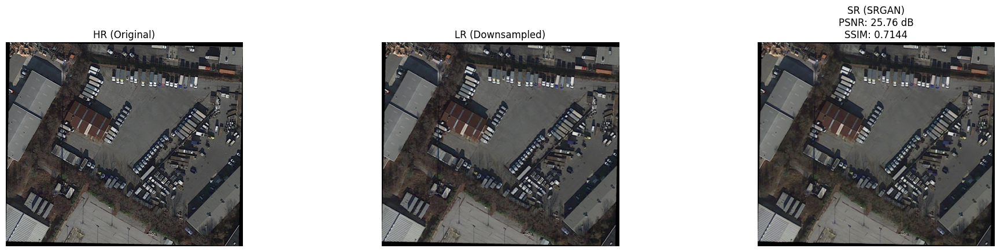

In [5]:
import os
import torch
import torchvision.transforms as transforms
import torch.nn.functional as F
from torchmetrics.image.psnr import PeakSignalNoiseRatio
from torchmetrics.image.ssim import StructuralSimilarityIndexMeasure
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np


model_path = "/kaggle/input/model-26-epoch/srgan_generator_epoch_26.pth"
test_image_path = "/kaggle/input/model-test-images/Model_Test_Images/Test_Images/P0269.png"  
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Scale factor
scale = 4

to_tensor = transforms.ToTensor()
to_pil = transforms.ToPILImage()

# Metrics
psnr_metric = PeakSignalNoiseRatio(data_range=1.0).to(device)
ssim_metric = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)

# Residual Block
import torch.nn as nn
class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels),
            nn.PReLU(),
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels)
        )

    def forward(self, x):
        return x + self.block(x)

# Generator
class Generator(nn.Module):
    def __init__(self, scale_factor=4, num_residual_blocks=16):
        super(Generator, self).__init__()
        self.initial = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=9, padding=4),
            nn.PReLU()
        )

        self.res_blocks = nn.Sequential(
            *[ResidualBlock(64) for _ in range(num_residual_blocks)]
        )

        self.bottleneck = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64)
        )

        upsample_blocks = []
        for _ in range(int(scale_factor / 2)):
            upsample_blocks += [
                nn.Conv2d(64, 256, kernel_size=3, padding=1),
                nn.PixelShuffle(2),
                nn.PReLU()
            ]
        self.upsampling = nn.Sequential(*upsample_blocks)

        self.final = nn.Conv2d(64, 3, kernel_size=9, padding=4)

    def forward(self, x):
        initial = self.initial(x)
        res = self.res_blocks(initial)
        bottleneck = self.bottleneck(res)
        upsampled = self.upsampling(initial + bottleneck)
        return self.final(upsampled)

# Load model
generator = Generator().to(device)
generator.load_state_dict(torch.load(model_path, map_location=device))
generator.eval()

# Load HR image
hr_img = Image.open(test_image_path).convert("RGB")
hr_tensor = to_tensor(hr_img).unsqueeze(0).to(device)

# Generate LR image
lr_img = hr_img.resize((hr_img.width // scale, hr_img.height // scale), Image.BICUBIC)
lr_tensor = to_tensor(lr_img).unsqueeze(0).to(device)

# Super-resolve
with torch.no_grad():
    sr_tensor = generator(lr_tensor)
    sr_tensor = torch.clamp(sr_tensor, 0, 1)


sr_resized = F.interpolate(sr_tensor, size=hr_tensor.shape[-2:], mode='bicubic', align_corners=False)

# Metrics
psnr = psnr_metric(sr_resized, hr_tensor).item()
ssim = ssim_metric(sr_resized, hr_tensor).item()

# Convert to PIL for display
hr_pil = to_pil(hr_tensor.squeeze().cpu())
lr_pil = to_pil(lr_tensor.squeeze().cpu())
sr_pil = to_pil(sr_resized.squeeze().cpu())


fig, axes = plt.subplots(1, 3, figsize=(20, 5))
axes[0].imshow(hr_pil)
axes[0].set_title("HR (Original)", fontsize=12)
axes[1].imshow(lr_pil)
axes[1].set_title("LR (Downsampled)", fontsize=12)
axes[2].imshow(sr_pil)
axes[2].set_title(f"SR (SRGAN)\nPSNR: {psnr:.2f} dB\nSSIM: {ssim:.4f}", fontsize=12)


for ax in axes:
    ax.axis("off")

plt.tight_layout(pad=3.0)  
plt.show()


<ipython-input-7-fd7e3f8b3142>:80: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  generator.load_state_dict(torch.load(model_path, map_location=device))


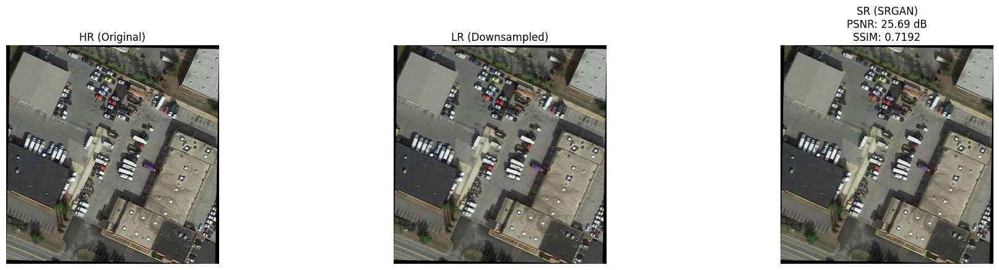

In [7]:
import os
import torch
import torchvision.transforms as transforms
import torch.nn.functional as F
from torchmetrics.image.psnr import PeakSignalNoiseRatio
from torchmetrics.image.ssim import StructuralSimilarityIndexMeasure
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np


model_path = "/kaggle/input/model-26-epoch/srgan_generator_epoch_26.pth"
test_image_path = "/kaggle/input/model-test-images/Model_Test_Images/Test_Images/P0284.png"  
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Scale factor
scale = 4

to_tensor = transforms.ToTensor()
to_pil = transforms.ToPILImage()

# Metrics
psnr_metric = PeakSignalNoiseRatio(data_range=1.0).to(device)
ssim_metric = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)

# Residual Block
import torch.nn as nn
class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels),
            nn.PReLU(),
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels)
        )

    def forward(self, x):
        return x + self.block(x)

# Generator
class Generator(nn.Module):
    def __init__(self, scale_factor=4, num_residual_blocks=16):
        super(Generator, self).__init__()
        self.initial = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=9, padding=4),
            nn.PReLU()
        )

        self.res_blocks = nn.Sequential(
            *[ResidualBlock(64) for _ in range(num_residual_blocks)]
        )

        self.bottleneck = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64)
        )

        upsample_blocks = []
        for _ in range(int(scale_factor / 2)):
            upsample_blocks += [
                nn.Conv2d(64, 256, kernel_size=3, padding=1),
                nn.PixelShuffle(2),
                nn.PReLU()
            ]
        self.upsampling = nn.Sequential(*upsample_blocks)

        self.final = nn.Conv2d(64, 3, kernel_size=9, padding=4)

    def forward(self, x):
        initial = self.initial(x)
        res = self.res_blocks(initial)
        bottleneck = self.bottleneck(res)
        upsampled = self.upsampling(initial + bottleneck)
        return self.final(upsampled)

# Load model
generator = Generator().to(device)
generator.load_state_dict(torch.load(model_path, map_location=device))
generator.eval()

# Load HR image
hr_img = Image.open(test_image_path).convert("RGB")
hr_tensor = to_tensor(hr_img).unsqueeze(0).to(device)

# Generate LR image
lr_img = hr_img.resize((hr_img.width // scale, hr_img.height // scale), Image.BICUBIC)
lr_tensor = to_tensor(lr_img).unsqueeze(0).to(device)

# Super-resolve
with torch.no_grad():
    sr_tensor = generator(lr_tensor)
    sr_tensor = torch.clamp(sr_tensor, 0, 1)


sr_resized = F.interpolate(sr_tensor, size=hr_tensor.shape[-2:], mode='bicubic', align_corners=False)

# Metrics
psnr = psnr_metric(sr_resized, hr_tensor).item()
ssim = ssim_metric(sr_resized, hr_tensor).item()

# Convert to PIL for display
hr_pil = to_pil(hr_tensor.squeeze().cpu())
lr_pil = to_pil(lr_tensor.squeeze().cpu())
sr_pil = to_pil(sr_resized.squeeze().cpu())


fig, axes = plt.subplots(1, 3, figsize=(20, 5))
axes[0].imshow(hr_pil)
axes[0].set_title("HR (Original)", fontsize=12)
axes[1].imshow(lr_pil)
axes[1].set_title("LR (Downsampled)", fontsize=12)
axes[2].imshow(sr_pil)
axes[2].set_title(f"SR (SRGAN)\nPSNR: {psnr:.2f} dB\nSSIM: {ssim:.4f}", fontsize=12)


for ax in axes:
    ax.axis("off")

plt.tight_layout(pad=3.0)  
plt.show()


# TrainImages

<ipython-input-8-9f3f9ad56ec3>:80: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  generator.load_state_dict(torch.load(model_path, map_location=device))


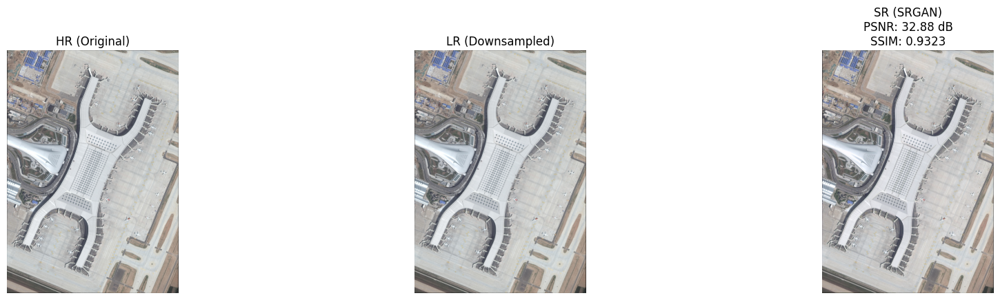

In [8]:
import os
import torch
import torchvision.transforms as transforms
import torch.nn.functional as F
from torchmetrics.image.psnr import PeakSignalNoiseRatio
from torchmetrics.image.ssim import StructuralSimilarityIndexMeasure
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np


model_path = "/kaggle/input/model-26-epoch/srgan_generator_epoch_26.pth"
test_image_path = "/kaggle/input/model-test-images/Model_Test_Images/Train_Images/P0000.png"  
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Scale factor
scale = 4

to_tensor = transforms.ToTensor()
to_pil = transforms.ToPILImage()

# Metrics
psnr_metric = PeakSignalNoiseRatio(data_range=1.0).to(device)
ssim_metric = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)

# Residual Block
import torch.nn as nn
class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels),
            nn.PReLU(),
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels)
        )

    def forward(self, x):
        return x + self.block(x)

# Generator
class Generator(nn.Module):
    def __init__(self, scale_factor=4, num_residual_blocks=16):
        super(Generator, self).__init__()
        self.initial = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=9, padding=4),
            nn.PReLU()
        )

        self.res_blocks = nn.Sequential(
            *[ResidualBlock(64) for _ in range(num_residual_blocks)]
        )

        self.bottleneck = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64)
        )

        upsample_blocks = []
        for _ in range(int(scale_factor / 2)):
            upsample_blocks += [
                nn.Conv2d(64, 256, kernel_size=3, padding=1),
                nn.PixelShuffle(2),
                nn.PReLU()
            ]
        self.upsampling = nn.Sequential(*upsample_blocks)

        self.final = nn.Conv2d(64, 3, kernel_size=9, padding=4)

    def forward(self, x):
        initial = self.initial(x)
        res = self.res_blocks(initial)
        bottleneck = self.bottleneck(res)
        upsampled = self.upsampling(initial + bottleneck)
        return self.final(upsampled)

# Load model
generator = Generator().to(device)
generator.load_state_dict(torch.load(model_path, map_location=device))
generator.eval()

# Load HR image
hr_img = Image.open(test_image_path).convert("RGB")
hr_tensor = to_tensor(hr_img).unsqueeze(0).to(device)

# Generate LR image
lr_img = hr_img.resize((hr_img.width // scale, hr_img.height // scale), Image.BICUBIC)
lr_tensor = to_tensor(lr_img).unsqueeze(0).to(device)

# Super-resolve
with torch.no_grad():
    sr_tensor = generator(lr_tensor)
    sr_tensor = torch.clamp(sr_tensor, 0, 1)


sr_resized = F.interpolate(sr_tensor, size=hr_tensor.shape[-2:], mode='bicubic', align_corners=False)

# Metrics
psnr = psnr_metric(sr_resized, hr_tensor).item()
ssim = ssim_metric(sr_resized, hr_tensor).item()

# Convert to PIL for display
hr_pil = to_pil(hr_tensor.squeeze().cpu())
lr_pil = to_pil(lr_tensor.squeeze().cpu())
sr_pil = to_pil(sr_resized.squeeze().cpu())


fig, axes = plt.subplots(1, 3, figsize=(20, 5))
axes[0].imshow(hr_pil)
axes[0].set_title("HR (Original)", fontsize=12)
axes[1].imshow(lr_pil)
axes[1].set_title("LR (Downsampled)", fontsize=12)
axes[2].imshow(sr_pil)
axes[2].set_title(f"SR (SRGAN)\nPSNR: {psnr:.2f} dB\nSSIM: {ssim:.4f}", fontsize=12)


for ax in axes:
    ax.axis("off")

plt.tight_layout(pad=3.0)  
plt.show()


<ipython-input-9-cd72d8113db1>:80: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  generator.load_state_dict(torch.load(model_path, map_location=device))


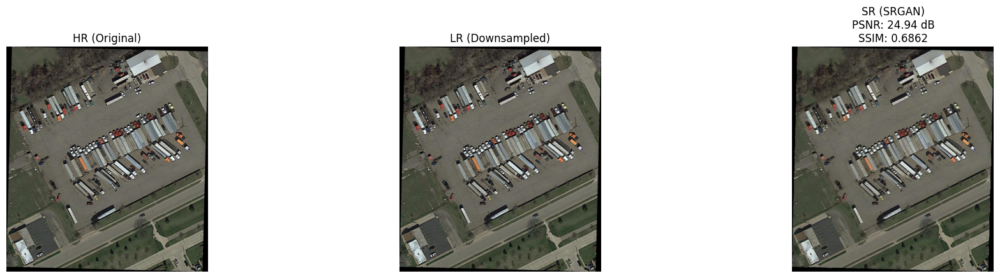

In [9]:
import os
import torch
import torchvision.transforms as transforms
import torch.nn.functional as F
from torchmetrics.image.psnr import PeakSignalNoiseRatio
from torchmetrics.image.ssim import StructuralSimilarityIndexMeasure
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np


model_path = "/kaggle/input/model-26-epoch/srgan_generator_epoch_26.pth"
test_image_path = "/kaggle/input/model-test-images/Model_Test_Images/Train_Images/P0011.png"  
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Scale factor
scale = 4

to_tensor = transforms.ToTensor()
to_pil = transforms.ToPILImage()

# Metrics
psnr_metric = PeakSignalNoiseRatio(data_range=1.0).to(device)
ssim_metric = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)

# Residual Block
import torch.nn as nn
class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels),
            nn.PReLU(),
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels)
        )

    def forward(self, x):
        return x + self.block(x)

# Generator
class Generator(nn.Module):
    def __init__(self, scale_factor=4, num_residual_blocks=16):
        super(Generator, self).__init__()
        self.initial = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=9, padding=4),
            nn.PReLU()
        )

        self.res_blocks = nn.Sequential(
            *[ResidualBlock(64) for _ in range(num_residual_blocks)]
        )

        self.bottleneck = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64)
        )

        upsample_blocks = []
        for _ in range(int(scale_factor / 2)):
            upsample_blocks += [
                nn.Conv2d(64, 256, kernel_size=3, padding=1),
                nn.PixelShuffle(2),
                nn.PReLU()
            ]
        self.upsampling = nn.Sequential(*upsample_blocks)

        self.final = nn.Conv2d(64, 3, kernel_size=9, padding=4)

    def forward(self, x):
        initial = self.initial(x)
        res = self.res_blocks(initial)
        bottleneck = self.bottleneck(res)
        upsampled = self.upsampling(initial + bottleneck)
        return self.final(upsampled)

# Load model
generator = Generator().to(device)
generator.load_state_dict(torch.load(model_path, map_location=device))
generator.eval()

# Load HR image
hr_img = Image.open(test_image_path).convert("RGB")
hr_tensor = to_tensor(hr_img).unsqueeze(0).to(device)

# Generate LR image
lr_img = hr_img.resize((hr_img.width // scale, hr_img.height // scale), Image.BICUBIC)
lr_tensor = to_tensor(lr_img).unsqueeze(0).to(device)

# Super-resolve
with torch.no_grad():
    sr_tensor = generator(lr_tensor)
    sr_tensor = torch.clamp(sr_tensor, 0, 1)


sr_resized = F.interpolate(sr_tensor, size=hr_tensor.shape[-2:], mode='bicubic', align_corners=False)

# Metrics
psnr = psnr_metric(sr_resized, hr_tensor).item()
ssim = ssim_metric(sr_resized, hr_tensor).item()

# Convert to PIL for display
hr_pil = to_pil(hr_tensor.squeeze().cpu())
lr_pil = to_pil(lr_tensor.squeeze().cpu())
sr_pil = to_pil(sr_resized.squeeze().cpu())


fig, axes = plt.subplots(1, 3, figsize=(20, 5))
axes[0].imshow(hr_pil)
axes[0].set_title("HR (Original)", fontsize=12)
axes[1].imshow(lr_pil)
axes[1].set_title("LR (Downsampled)", fontsize=12)
axes[2].imshow(sr_pil)
axes[2].set_title(f"SR (SRGAN)\nPSNR: {psnr:.2f} dB\nSSIM: {ssim:.4f}", fontsize=12)


for ax in axes:
    ax.axis("off")

plt.tight_layout(pad=3.0)  
plt.show()


<ipython-input-11-8a34e0e7675c>:80: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  generator.load_state_dict(torch.load(model_path, map_location=device))


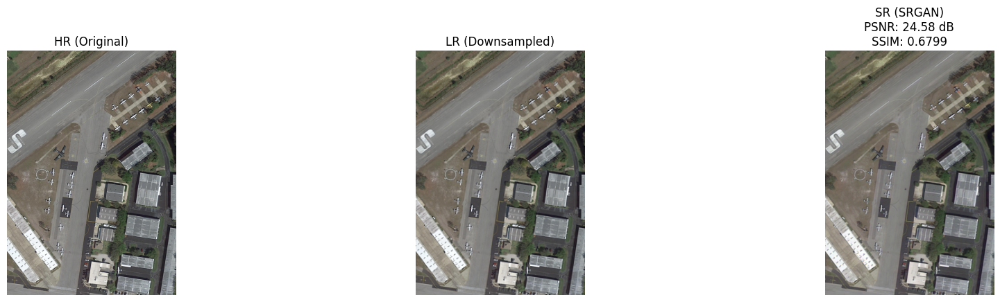

In [11]:
import os
import torch
import torchvision.transforms as transforms
import torch.nn.functional as F
from torchmetrics.image.psnr import PeakSignalNoiseRatio
from torchmetrics.image.ssim import StructuralSimilarityIndexMeasure
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np


model_path = "/kaggle/input/model-26-epoch/srgan_generator_epoch_26.pth"
test_image_path = "/kaggle/input/model-test-images/Model_Test_Images/Train_Images/P0207.png"  
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Scale factor
scale = 4

to_tensor = transforms.ToTensor()
to_pil = transforms.ToPILImage()

# Metrics
psnr_metric = PeakSignalNoiseRatio(data_range=1.0).to(device)
ssim_metric = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)

# Residual Block
import torch.nn as nn
class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels),
            nn.PReLU(),
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels)
        )

    def forward(self, x):
        return x + self.block(x)

# Generator
class Generator(nn.Module):
    def __init__(self, scale_factor=4, num_residual_blocks=16):
        super(Generator, self).__init__()
        self.initial = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=9, padding=4),
            nn.PReLU()
        )

        self.res_blocks = nn.Sequential(
            *[ResidualBlock(64) for _ in range(num_residual_blocks)]
        )

        self.bottleneck = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64)
        )

        upsample_blocks = []
        for _ in range(int(scale_factor / 2)):
            upsample_blocks += [
                nn.Conv2d(64, 256, kernel_size=3, padding=1),
                nn.PixelShuffle(2),
                nn.PReLU()
            ]
        self.upsampling = nn.Sequential(*upsample_blocks)

        self.final = nn.Conv2d(64, 3, kernel_size=9, padding=4)

    def forward(self, x):
        initial = self.initial(x)
        res = self.res_blocks(initial)
        bottleneck = self.bottleneck(res)
        upsampled = self.upsampling(initial + bottleneck)
        return self.final(upsampled)

# Load model
generator = Generator().to(device)
generator.load_state_dict(torch.load(model_path, map_location=device))
generator.eval()

# Load HR image
hr_img = Image.open(test_image_path).convert("RGB")
hr_tensor = to_tensor(hr_img).unsqueeze(0).to(device)

# Generate LR image
lr_img = hr_img.resize((hr_img.width // scale, hr_img.height // scale), Image.BICUBIC)
lr_tensor = to_tensor(lr_img).unsqueeze(0).to(device)

# Super-resolve
with torch.no_grad():
    sr_tensor = generator(lr_tensor)
    sr_tensor = torch.clamp(sr_tensor, 0, 1)


sr_resized = F.interpolate(sr_tensor, size=hr_tensor.shape[-2:], mode='bicubic', align_corners=False)

# Metrics
psnr = psnr_metric(sr_resized, hr_tensor).item()
ssim = ssim_metric(sr_resized, hr_tensor).item()

# Convert to PIL for display
hr_pil = to_pil(hr_tensor.squeeze().cpu())
lr_pil = to_pil(lr_tensor.squeeze().cpu())
sr_pil = to_pil(sr_resized.squeeze().cpu())


fig, axes = plt.subplots(1, 3, figsize=(20, 5))
axes[0].imshow(hr_pil)
axes[0].set_title("HR (Original)", fontsize=12)
axes[1].imshow(lr_pil)
axes[1].set_title("LR (Downsampled)", fontsize=12)
axes[2].imshow(sr_pil)
axes[2].set_title(f"SR (SRGAN)\nPSNR: {psnr:.2f} dB\nSSIM: {ssim:.4f}", fontsize=12)


for ax in axes:
    ax.axis("off")

plt.tight_layout(pad=3.0)  
plt.show()


<ipython-input-12-6339ed8d03f1>:80: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  generator.load_state_dict(torch.load(model_path, map_location=device))


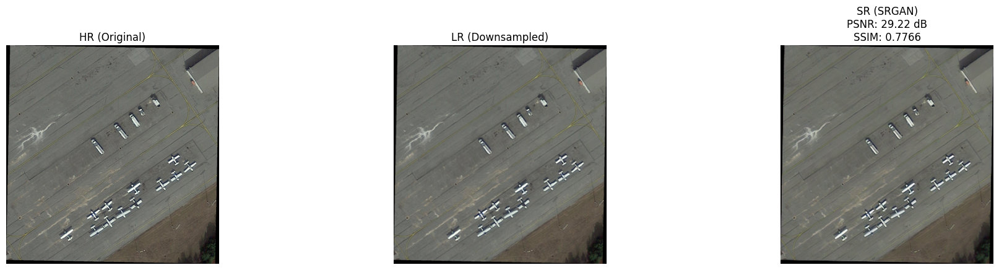

In [12]:
import os
import torch
import torchvision.transforms as transforms
import torch.nn.functional as F
from torchmetrics.image.psnr import PeakSignalNoiseRatio
from torchmetrics.image.ssim import StructuralSimilarityIndexMeasure
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np


model_path = "/kaggle/input/model-26-epoch/srgan_generator_epoch_26.pth"
test_image_path = "/kaggle/input/model-test-images/Model_Test_Images/Train_Images/P0289.png"  
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Scale factor
scale = 4

to_tensor = transforms.ToTensor()
to_pil = transforms.ToPILImage()

# Metrics
psnr_metric = PeakSignalNoiseRatio(data_range=1.0).to(device)
ssim_metric = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)

# Residual Block
import torch.nn as nn
class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels),
            nn.PReLU(),
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels)
        )

    def forward(self, x):
        return x + self.block(x)

# Generator
class Generator(nn.Module):
    def __init__(self, scale_factor=4, num_residual_blocks=16):
        super(Generator, self).__init__()
        self.initial = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=9, padding=4),
            nn.PReLU()
        )

        self.res_blocks = nn.Sequential(
            *[ResidualBlock(64) for _ in range(num_residual_blocks)]
        )

        self.bottleneck = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64)
        )

        upsample_blocks = []
        for _ in range(int(scale_factor / 2)):
            upsample_blocks += [
                nn.Conv2d(64, 256, kernel_size=3, padding=1),
                nn.PixelShuffle(2),
                nn.PReLU()
            ]
        self.upsampling = nn.Sequential(*upsample_blocks)

        self.final = nn.Conv2d(64, 3, kernel_size=9, padding=4)

    def forward(self, x):
        initial = self.initial(x)
        res = self.res_blocks(initial)
        bottleneck = self.bottleneck(res)
        upsampled = self.upsampling(initial + bottleneck)
        return self.final(upsampled)

# Load model
generator = Generator().to(device)
generator.load_state_dict(torch.load(model_path, map_location=device))
generator.eval()

# Load HR image
hr_img = Image.open(test_image_path).convert("RGB")
hr_tensor = to_tensor(hr_img).unsqueeze(0).to(device)

# Generate LR image
lr_img = hr_img.resize((hr_img.width // scale, hr_img.height // scale), Image.BICUBIC)
lr_tensor = to_tensor(lr_img).unsqueeze(0).to(device)

# Super-resolve
with torch.no_grad():
    sr_tensor = generator(lr_tensor)
    sr_tensor = torch.clamp(sr_tensor, 0, 1)


sr_resized = F.interpolate(sr_tensor, size=hr_tensor.shape[-2:], mode='bicubic', align_corners=False)

# Metrics
psnr = psnr_metric(sr_resized, hr_tensor).item()
ssim = ssim_metric(sr_resized, hr_tensor).item()

# Convert to PIL for display
hr_pil = to_pil(hr_tensor.squeeze().cpu())
lr_pil = to_pil(lr_tensor.squeeze().cpu())
sr_pil = to_pil(sr_resized.squeeze().cpu())


fig, axes = plt.subplots(1, 3, figsize=(20, 5))
axes[0].imshow(hr_pil)
axes[0].set_title("HR (Original)", fontsize=12)
axes[1].imshow(lr_pil)
axes[1].set_title("LR (Downsampled)", fontsize=12)
axes[2].imshow(sr_pil)
axes[2].set_title(f"SR (SRGAN)\nPSNR: {psnr:.2f} dB\nSSIM: {ssim:.4f}", fontsize=12)


for ax in axes:
    ax.axis("off")

plt.tight_layout(pad=3.0)  
plt.show()


<ipython-input-14-b054be81ffd0>:80: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  generator.load_state_dict(torch.load(model_path, map_location=device))


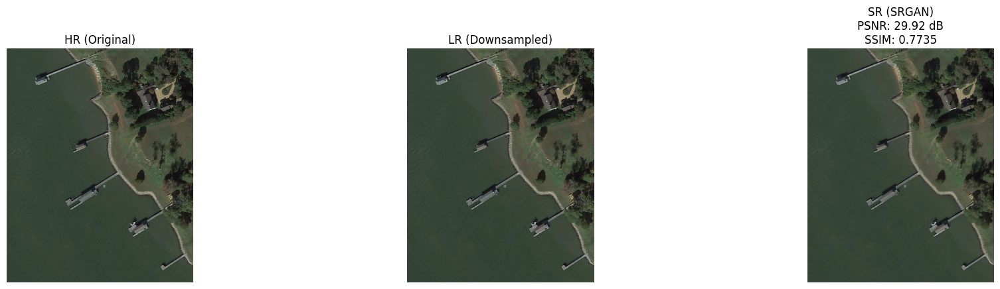

In [14]:
import os
import torch
import torchvision.transforms as transforms
import torch.nn.functional as F
from torchmetrics.image.psnr import PeakSignalNoiseRatio
from torchmetrics.image.ssim import StructuralSimilarityIndexMeasure
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np


model_path = "/kaggle/input/model-26-epoch/srgan_generator_epoch_26.pth"
test_image_path = "/kaggle/input/model-test-images/Model_Test_Images/Train_Images/P0322.png"  
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Scale factor
scale = 4

to_tensor = transforms.ToTensor()
to_pil = transforms.ToPILImage()

# Metrics
psnr_metric = PeakSignalNoiseRatio(data_range=1.0).to(device)
ssim_metric = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)

# Residual Block
import torch.nn as nn
class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels),
            nn.PReLU(),
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels)
        )

    def forward(self, x):
        return x + self.block(x)

# Generator
class Generator(nn.Module):
    def __init__(self, scale_factor=4, num_residual_blocks=16):
        super(Generator, self).__init__()
        self.initial = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=9, padding=4),
            nn.PReLU()
        )

        self.res_blocks = nn.Sequential(
            *[ResidualBlock(64) for _ in range(num_residual_blocks)]
        )

        self.bottleneck = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64)
        )

        upsample_blocks = []
        for _ in range(int(scale_factor / 2)):
            upsample_blocks += [
                nn.Conv2d(64, 256, kernel_size=3, padding=1),
                nn.PixelShuffle(2),
                nn.PReLU()
            ]
        self.upsampling = nn.Sequential(*upsample_blocks)

        self.final = nn.Conv2d(64, 3, kernel_size=9, padding=4)

    def forward(self, x):
        initial = self.initial(x)
        res = self.res_blocks(initial)
        bottleneck = self.bottleneck(res)
        upsampled = self.upsampling(initial + bottleneck)
        return self.final(upsampled)

# Load model
generator = Generator().to(device)
generator.load_state_dict(torch.load(model_path, map_location=device))
generator.eval()

# Load HR image
hr_img = Image.open(test_image_path).convert("RGB")
hr_tensor = to_tensor(hr_img).unsqueeze(0).to(device)

# Generate LR image
lr_img = hr_img.resize((hr_img.width // scale, hr_img.height // scale), Image.BICUBIC)
lr_tensor = to_tensor(lr_img).unsqueeze(0).to(device)

# Super-resolve
with torch.no_grad():
    sr_tensor = generator(lr_tensor)
    sr_tensor = torch.clamp(sr_tensor, 0, 1)


sr_resized = F.interpolate(sr_tensor, size=hr_tensor.shape[-2:], mode='bicubic', align_corners=False)

# Metrics
psnr = psnr_metric(sr_resized, hr_tensor).item()
ssim = ssim_metric(sr_resized, hr_tensor).item()

# Convert to PIL for display
hr_pil = to_pil(hr_tensor.squeeze().cpu())
lr_pil = to_pil(lr_tensor.squeeze().cpu())
sr_pil = to_pil(sr_resized.squeeze().cpu())


fig, axes = plt.subplots(1, 3, figsize=(20, 5))
axes[0].imshow(hr_pil)
axes[0].set_title("HR (Original)", fontsize=12)
axes[1].imshow(lr_pil)
axes[1].set_title("LR (Downsampled)", fontsize=12)
axes[2].imshow(sr_pil)
axes[2].set_title(f"SR (SRGAN)\nPSNR: {psnr:.2f} dB\nSSIM: {ssim:.4f}", fontsize=12)


for ax in axes:
    ax.axis("off")

plt.tight_layout(pad=3.0)  
plt.show()


<ipython-input-15-4472b4597f58>:80: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  generator.load_state_dict(torch.load(model_path, map_location=device))


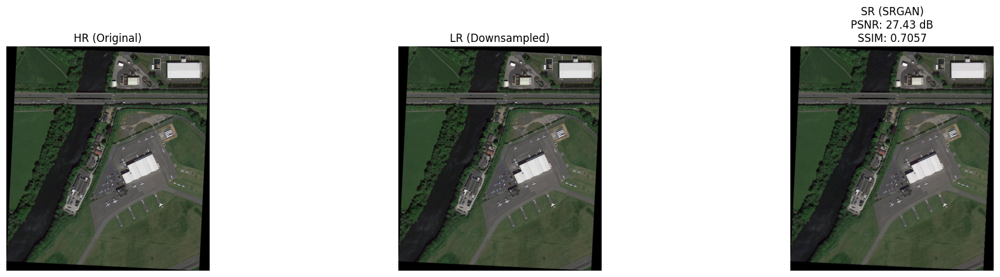

In [15]:
import os
import torch
import torchvision.transforms as transforms
import torch.nn.functional as F
from torchmetrics.image.psnr import PeakSignalNoiseRatio
from torchmetrics.image.ssim import StructuralSimilarityIndexMeasure
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np


model_path = "/kaggle/input/model-26-epoch/srgan_generator_epoch_26.pth"
test_image_path = "/kaggle/input/model-test-images/Model_Test_Images/Train_Images/P0119.png"  
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Scale factor
scale = 4

to_tensor = transforms.ToTensor()
to_pil = transforms.ToPILImage()

# Metrics
psnr_metric = PeakSignalNoiseRatio(data_range=1.0).to(device)
ssim_metric = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)

# Residual Block
import torch.nn as nn
class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels),
            nn.PReLU(),
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels)
        )

    def forward(self, x):
        return x + self.block(x)

# Generator
class Generator(nn.Module):
    def __init__(self, scale_factor=4, num_residual_blocks=16):
        super(Generator, self).__init__()
        self.initial = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=9, padding=4),
            nn.PReLU()
        )

        self.res_blocks = nn.Sequential(
            *[ResidualBlock(64) for _ in range(num_residual_blocks)]
        )

        self.bottleneck = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64)
        )

        upsample_blocks = []
        for _ in range(int(scale_factor / 2)):
            upsample_blocks += [
                nn.Conv2d(64, 256, kernel_size=3, padding=1),
                nn.PixelShuffle(2),
                nn.PReLU()
            ]
        self.upsampling = nn.Sequential(*upsample_blocks)

        self.final = nn.Conv2d(64, 3, kernel_size=9, padding=4)

    def forward(self, x):
        initial = self.initial(x)
        res = self.res_blocks(initial)
        bottleneck = self.bottleneck(res)
        upsampled = self.upsampling(initial + bottleneck)
        return self.final(upsampled)

# Load model
generator = Generator().to(device)
generator.load_state_dict(torch.load(model_path, map_location=device))
generator.eval()

# Load HR image
hr_img = Image.open(test_image_path).convert("RGB")
hr_tensor = to_tensor(hr_img).unsqueeze(0).to(device)

# Generate LR image
lr_img = hr_img.resize((hr_img.width // scale, hr_img.height // scale), Image.BICUBIC)
lr_tensor = to_tensor(lr_img).unsqueeze(0).to(device)

# Super-resolve
with torch.no_grad():
    sr_tensor = generator(lr_tensor)
    sr_tensor = torch.clamp(sr_tensor, 0, 1)


sr_resized = F.interpolate(sr_tensor, size=hr_tensor.shape[-2:], mode='bicubic', align_corners=False)

# Metrics
psnr = psnr_metric(sr_resized, hr_tensor).item()
ssim = ssim_metric(sr_resized, hr_tensor).item()

# Convert to PIL for display
hr_pil = to_pil(hr_tensor.squeeze().cpu())
lr_pil = to_pil(lr_tensor.squeeze().cpu())
sr_pil = to_pil(sr_resized.squeeze().cpu())


fig, axes = plt.subplots(1, 3, figsize=(20, 5))
axes[0].imshow(hr_pil)
axes[0].set_title("HR (Original)", fontsize=12)
axes[1].imshow(lr_pil)
axes[1].set_title("LR (Downsampled)", fontsize=12)
axes[2].imshow(sr_pil)
axes[2].set_title(f"SR (SRGAN)\nPSNR: {psnr:.2f} dB\nSSIM: {ssim:.4f}", fontsize=12)


for ax in axes:
    ax.axis("off")

plt.tight_layout(pad=3.0)  
plt.show()


# Testing with downloading the images

In [18]:
import os
import torch
import torchvision.transforms as transforms
import torch.nn.functional as F
from torchmetrics.image.psnr import PeakSignalNoiseRatio
from torchmetrics.image.ssim import StructuralSimilarityIndexMeasure
from PIL import Image
from torchvision.utils import save_image

# ----- Settings -----
model_path = "/kaggle/input/model-26-epoch/srgan_generator_epoch_26.pth"
image_path = "/kaggle/input/model-test-images/Model_Test_Images/Train_Images/P0119.png"
scale = 4
output_dir = "/kaggle/working/Downloads"
os.makedirs(output_dir, exist_ok=True)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ----- Transforms -----
to_tensor = transforms.ToTensor()
to_pil = transforms.ToPILImage()

# ----- Metrics -----
psnr_metric = PeakSignalNoiseRatio(data_range=1.0).to(device)
ssim_metric = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)

# ----- Generator -----
import torch.nn as nn

class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels),
            nn.PReLU(),
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels)
        )

    def forward(self, x):
        return x + self.block(x)

class Generator(nn.Module):
    def __init__(self, scale_factor=4, num_residual_blocks=16):
        super(Generator, self).__init__()
        self.initial = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=9, padding=4),
            nn.PReLU()
        )
        self.res_blocks = nn.Sequential(
            *[ResidualBlock(64) for _ in range(num_residual_blocks)]
        )
        self.bottleneck = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64)
        )
        upsample_blocks = []
        for _ in range(int(scale_factor / 2)):
            upsample_blocks += [
                nn.Conv2d(64, 256, kernel_size=3, padding=1),
                nn.PixelShuffle(2),
                nn.PReLU()
            ]
        self.upsampling = nn.Sequential(*upsample_blocks)
        self.final = nn.Conv2d(64, 3, kernel_size=9, padding=4)

    def forward(self, x):
        initial = self.initial(x)
        res = self.res_blocks(initial)
        bottleneck = self.bottleneck(res)
        upsampled = self.upsampling(initial + bottleneck)
        return self.final(upsampled)

# ----- Load model -----
generator = Generator().to(device)
generator.load_state_dict(torch.load(model_path, map_location=device))
generator.eval()

# ----- Load image -----
hr_img = Image.open(image_path).convert("RGB")
hr_tensor = to_tensor(hr_img).unsqueeze(0).to(device)

lr_img = hr_img.resize((hr_img.width // scale, hr_img.height // scale), Image.BICUBIC)
lr_tensor = to_tensor(lr_img).unsqueeze(0).to(device)

# ----- SR Prediction -----
with torch.no_grad():
    sr_tensor = generator(lr_tensor)
    sr_tensor = torch.clamp(sr_tensor, 0, 1)

sr_resized = F.interpolate(sr_tensor, size=hr_tensor.shape[-2:], mode='bicubic', align_corners=False)

# ----- Metric Calculation -----
psnr = psnr_metric(sr_resized, hr_tensor).item()
ssim = ssim_metric(sr_resized, hr_tensor).item()

# ----- Saving Images -----
hr_path = os.path.join(output_dir, "hr_image_0119.png")
lr_path = os.path.join(output_dir, "lr_image_0119.png")
sr_path = os.path.join(output_dir, "sr_image_0119.png")

save_image(hr_tensor, hr_path)
save_image(lr_tensor, lr_path)
save_image(sr_resized, sr_path)

print(f"Saved HR image → {hr_path}")
print(f"Saved LR image → {lr_path}")
print(f"Saved SR image → {sr_path}")
print(f"PSNR: {psnr:.2f} dB | SSIM: {ssim:.4f}")


<ipython-input-18-a3beac3ffeba>:76: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  generator.load_state_dict(torch.load(model_path, map_location=device))


Saved HR image → /kaggle/working/Downloads/hr_image_0119.png
Saved LR image → /kaggle/working/Downloads/lr_image_0119.png
Saved SR image → /kaggle/working/Downloads/sr_image_0119.png
PSNR: 27.43 dB | SSIM: 0.7057


In [19]:
import os
import torch
import torchvision.transforms as transforms
import torch.nn.functional as F
from torchmetrics.image.psnr import PeakSignalNoiseRatio
from torchmetrics.image.ssim import StructuralSimilarityIndexMeasure
from PIL import Image
from torchvision.utils import save_image

# ----- Settings -----
model_path = "/kaggle/input/model-26-epoch/srgan_generator_epoch_26.pth"
image_path = "/kaggle/input/model-test-images/Model_Test_Images/Test_Images/P0015.png"
scale = 4
output_dir = "/kaggle/working/Downloads"
os.makedirs(output_dir, exist_ok=True)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ----- Transforms -----
to_tensor = transforms.ToTensor()
to_pil = transforms.ToPILImage()

# ----- Metrics -----
psnr_metric = PeakSignalNoiseRatio(data_range=1.0).to(device)
ssim_metric = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)

# ----- Generator -----
import torch.nn as nn

class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels),
            nn.PReLU(),
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels)
        )

    def forward(self, x):
        return x + self.block(x)

class Generator(nn.Module):
    def __init__(self, scale_factor=4, num_residual_blocks=16):
        super(Generator, self).__init__()
        self.initial = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=9, padding=4),
            nn.PReLU()
        )
        self.res_blocks = nn.Sequential(
            *[ResidualBlock(64) for _ in range(num_residual_blocks)]
        )
        self.bottleneck = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64)
        )
        upsample_blocks = []
        for _ in range(int(scale_factor / 2)):
            upsample_blocks += [
                nn.Conv2d(64, 256, kernel_size=3, padding=1),
                nn.PixelShuffle(2),
                nn.PReLU()
            ]
        self.upsampling = nn.Sequential(*upsample_blocks)
        self.final = nn.Conv2d(64, 3, kernel_size=9, padding=4)

    def forward(self, x):
        initial = self.initial(x)
        res = self.res_blocks(initial)
        bottleneck = self.bottleneck(res)
        upsampled = self.upsampling(initial + bottleneck)
        return self.final(upsampled)

# ----- Load model -----
generator = Generator().to(device)
generator.load_state_dict(torch.load(model_path, map_location=device))
generator.eval()

# ----- Load image -----
hr_img = Image.open(image_path).convert("RGB")
hr_tensor = to_tensor(hr_img).unsqueeze(0).to(device)

lr_img = hr_img.resize((hr_img.width // scale, hr_img.height // scale), Image.BICUBIC)
lr_tensor = to_tensor(lr_img).unsqueeze(0).to(device)

# ----- SR Prediction -----
with torch.no_grad():
    sr_tensor = generator(lr_tensor)
    sr_tensor = torch.clamp(sr_tensor, 0, 1)

sr_resized = F.interpolate(sr_tensor, size=hr_tensor.shape[-2:], mode='bicubic', align_corners=False)

# ----- Metric Calculation -----
psnr = psnr_metric(sr_resized, hr_tensor).item()
ssim = ssim_metric(sr_resized, hr_tensor).item()

# ----- Saving Images -----
hr_path = os.path.join(output_dir, "hr_image_0015.png")
lr_path = os.path.join(output_dir, "lr_image_0015.png")
sr_path = os.path.join(output_dir, "sr_image_0015.png")

save_image(hr_tensor, hr_path)
save_image(lr_tensor, lr_path)
save_image(sr_resized, sr_path)

print(f"Saved HR image → {hr_path}")
print(f"Saved LR image → {lr_path}")
print(f"Saved SR image → {sr_path}")
print(f"PSNR: {psnr:.2f} dB | SSIM: {ssim:.4f}")


<ipython-input-19-53d5ad9d5c3b>:76: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  generator.load_state_dict(torch.load(model_path, map_location=device))


Saved HR image → /kaggle/working/Downloads/hr_image_0015.png
Saved LR image → /kaggle/working/Downloads/lr_image_0015.png
Saved SR image → /kaggle/working/Downloads/sr_image_0015.png
PSNR: 26.43 dB | SSIM: 0.8235


In [21]:
import os
import torch
import torchvision.transforms as transforms
import torch.nn.functional as F
from torchmetrics.image.psnr import PeakSignalNoiseRatio
from torchmetrics.image.ssim import StructuralSimilarityIndexMeasure
from PIL import Image
from torchvision.utils import save_image

# ----- Settings -----
model_path = "/kaggle/input/model-26-epoch/srgan_generator_epoch_26.pth"
image_path = "/kaggle/input/model-test-images/Model_Test_Images/Test_Images/P0616.png"
scale = 4
output_dir = "/kaggle/working/Downloads"
os.makedirs(output_dir, exist_ok=True)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ----- Transforms -----
to_tensor = transforms.ToTensor()
to_pil = transforms.ToPILImage()

# ----- Metrics -----
psnr_metric = PeakSignalNoiseRatio(data_range=1.0).to(device)
ssim_metric = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)

# ----- Generator -----
import torch.nn as nn

class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels),
            nn.PReLU(),
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels)
        )

    def forward(self, x):
        return x + self.block(x)

class Generator(nn.Module):
    def __init__(self, scale_factor=4, num_residual_blocks=16):
        super(Generator, self).__init__()
        self.initial = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=9, padding=4),
            nn.PReLU()
        )
        self.res_blocks = nn.Sequential(
            *[ResidualBlock(64) for _ in range(num_residual_blocks)]
        )
        self.bottleneck = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64)
        )
        upsample_blocks = []
        for _ in range(int(scale_factor / 2)):
            upsample_blocks += [
                nn.Conv2d(64, 256, kernel_size=3, padding=1),
                nn.PixelShuffle(2),
                nn.PReLU()
            ]
        self.upsampling = nn.Sequential(*upsample_blocks)
        self.final = nn.Conv2d(64, 3, kernel_size=9, padding=4)

    def forward(self, x):
        initial = self.initial(x)
        res = self.res_blocks(initial)
        bottleneck = self.bottleneck(res)
        upsampled = self.upsampling(initial + bottleneck)
        return self.final(upsampled)

# ----- Load model -----
generator = Generator().to(device)
generator.load_state_dict(torch.load(model_path, map_location=device))
generator.eval()

# ----- Load image -----
hr_img = Image.open(image_path).convert("RGB")
hr_tensor = to_tensor(hr_img).unsqueeze(0).to(device)

lr_img = hr_img.resize((hr_img.width // scale, hr_img.height // scale), Image.BICUBIC)
lr_tensor = to_tensor(lr_img).unsqueeze(0).to(device)

# ----- SR Prediction -----
with torch.no_grad():
    sr_tensor = generator(lr_tensor)
    sr_tensor = torch.clamp(sr_tensor, 0, 1)

sr_resized = F.interpolate(sr_tensor, size=hr_tensor.shape[-2:], mode='bicubic', align_corners=False)

# ----- Metric Calculation -----
psnr = psnr_metric(sr_resized, hr_tensor).item()
ssim = ssim_metric(sr_resized, hr_tensor).item()

# ----- Saving Images -----
hr_path = os.path.join(output_dir, "hr_image_0616.png")
lr_path = os.path.join(output_dir, "lr_image_0616.png")
sr_path = os.path.join(output_dir, "sr_image_0616.png")

save_image(hr_tensor, hr_path)
save_image(lr_tensor, lr_path)
save_image(sr_resized, sr_path)

print(f"Saved HR image → {hr_path}")
print(f"Saved LR image → {lr_path}")
print(f"Saved SR image → {sr_path}")
print(f"PSNR: {psnr:.2f} dB | SSIM: {ssim:.4f}")


<ipython-input-21-36f9b33a0a16>:76: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  generator.load_state_dict(torch.load(model_path, map_location=device))


Saved HR image → /kaggle/working/Downloads/hr_image_0616.png
Saved LR image → /kaggle/working/Downloads/lr_image_0616.png
Saved SR image → /kaggle/working/Downloads/sr_image_0616.png
PSNR: 26.33 dB | SSIM: 0.6336


In [22]:
import os
import torch
import torchvision.transforms as transforms
import torch.nn.functional as F
from torchmetrics.image.psnr import PeakSignalNoiseRatio
from torchmetrics.image.ssim import StructuralSimilarityIndexMeasure
from PIL import Image
from torchvision.utils import save_image

# ----- Settings -----
model_path = "/kaggle/input/model-26-epoch/srgan_generator_epoch_26.pth"
image_path = "/kaggle/input/model-test-images/Model_Test_Images/Test_Images/P0937.png"
scale = 4
output_dir = "/kaggle/working/Downloads"
os.makedirs(output_dir, exist_ok=True)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ----- Transforms -----
to_tensor = transforms.ToTensor()
to_pil = transforms.ToPILImage()

# ----- Metrics -----
psnr_metric = PeakSignalNoiseRatio(data_range=1.0).to(device)
ssim_metric = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)

# ----- Generator -----
import torch.nn as nn

class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels),
            nn.PReLU(),
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels)
        )

    def forward(self, x):
        return x + self.block(x)

class Generator(nn.Module):
    def __init__(self, scale_factor=4, num_residual_blocks=16):
        super(Generator, self).__init__()
        self.initial = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=9, padding=4),
            nn.PReLU()
        )
        self.res_blocks = nn.Sequential(
            *[ResidualBlock(64) for _ in range(num_residual_blocks)]
        )
        self.bottleneck = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64)
        )
        upsample_blocks = []
        for _ in range(int(scale_factor / 2)):
            upsample_blocks += [
                nn.Conv2d(64, 256, kernel_size=3, padding=1),
                nn.PixelShuffle(2),
                nn.PReLU()
            ]
        self.upsampling = nn.Sequential(*upsample_blocks)
        self.final = nn.Conv2d(64, 3, kernel_size=9, padding=4)

    def forward(self, x):
        initial = self.initial(x)
        res = self.res_blocks(initial)
        bottleneck = self.bottleneck(res)
        upsampled = self.upsampling(initial + bottleneck)
        return self.final(upsampled)

# ----- Load model -----
generator = Generator().to(device)
generator.load_state_dict(torch.load(model_path, map_location=device))
generator.eval()

# ----- Load image -----
hr_img = Image.open(image_path).convert("RGB")
hr_tensor = to_tensor(hr_img).unsqueeze(0).to(device)

lr_img = hr_img.resize((hr_img.width // scale, hr_img.height // scale), Image.BICUBIC)
lr_tensor = to_tensor(lr_img).unsqueeze(0).to(device)

# ----- SR Prediction -----
with torch.no_grad():
    sr_tensor = generator(lr_tensor)
    sr_tensor = torch.clamp(sr_tensor, 0, 1)

sr_resized = F.interpolate(sr_tensor, size=hr_tensor.shape[-2:], mode='bicubic', align_corners=False)

# ----- Metric Calculation -----
psnr = psnr_metric(sr_resized, hr_tensor).item()
ssim = ssim_metric(sr_resized, hr_tensor).item()

# ----- Saving Images -----
hr_path = os.path.join(output_dir, "hr_image_0937.png")
lr_path = os.path.join(output_dir, "lr_image_0937.png")
sr_path = os.path.join(output_dir, "sr_image_0937.png")

save_image(hr_tensor, hr_path)
save_image(lr_tensor, lr_path)
save_image(sr_resized, sr_path)

print(f"Saved HR image → {hr_path}")
print(f"Saved LR image → {lr_path}")
print(f"Saved SR image → {sr_path}")
print(f"PSNR: {psnr:.2f} dB | SSIM: {ssim:.4f}")


<ipython-input-22-7e4ced8447e6>:76: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  generator.load_state_dict(torch.load(model_path, map_location=device))


Saved HR image → /kaggle/working/Downloads/hr_image_0937.png
Saved LR image → /kaggle/working/Downloads/lr_image_0937.png
Saved SR image → /kaggle/working/Downloads/sr_image_0937.png
PSNR: 25.30 dB | SSIM: 0.7335
